<a href="https://colab.research.google.com/github/ShawneilRodrigues/object-detection-using-pytorch/blob/main/global_wheat_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import random
from collections import Counter
from PIL import Image,ImageDraw
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torch
import torchvision
from torchvision import transforms as T
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

In [ ]:
!pip install opendatasets
import opendatasets as od
od.download("https://www.kaggle.com/c/global-wheat-detection")

100%|██████████| 607M/607M [00:37<00:00, 17.0MB/s]



Extracting archive ./global-wheat-detection/global-wheat-detection.zip to ./global-wheat-detection


In [ ]:
import pandas as pd
train=pd.read_csv('/content/global-wheat-detection/train.csv')

In [ ]:
cord=pd.DataFrame(list(train.bbox.apply(lambda x: x[1:-1].split(",")).values),columns=['x1','y1','w','h'])

In [ ]:
df=pd.concat([train,cord],axis=1)

In [ ]:
df['x1']=pd.to_numeric(df['x1'])
df['y1']=pd.to_numeric(df['y1'])
df['w']=pd.to_numeric(df['w'])
df['h']=pd.to_numeric(df['h'])

In [ ]:
df['x2']=df['x1']+df['w']
df['y2']=df['y1']+df['h']

In [ ]:
df

,image_id,width,height,bbox,source,x1,y1,w,h,x2,y2
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0,890.0,258.0
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0,356.0,606.0
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0,451.0,664.0
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0,943.0,202.0
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0,150.0,261.0
...,...,...,...,...,...,...,...,...,...,...,...
147788,5e0747034,1024,1024,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64.0,619.0,84.0,95.0,148.0,714.0
147789,5e0747034,1024,1024,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292.0,549.0,107.0,82.0,399.0,631.0
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134.0,228.0,141.0,71.0,275.0,299.0
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430.0,13.0,184.0,79.0,614.0,92.0


In [ ]:
df.drop(['bbox','width','height','w','h','source'],axis=1,inplace=True)

In [ ]:
df.head()

,image_id,x1,y1,x2,y2
0,b6ab77fd7,834.0,222.0,890.0,258.0
1,b6ab77fd7,226.0,548.0,356.0,606.0
2,b6ab77fd7,377.0,504.0,451.0,664.0
3,b6ab77fd7,834.0,95.0,943.0,202.0
4,b6ab77fd7,26.0,144.0,150.0,261.0


In [ ]:
unique_images=df['image_id'].unique()
unique_images

array(['b6ab77fd7', 'b53afdf5c', '7b72ea0fb', ..., 'a5c8d5f5c',
       'e6b5e296d', '5e0747034'], dtype=object)

In [ ]:
class custDat(torch.utils.data.Dataset):
  def __init__(self,df,unique_images,indices):
    self.df=df
    self.unique_images=unique_images
    self.indices=indices
  def __len__(self):
    return len(self.indices)
  def __getitem__(self,idx):
    Image_name=self.unique_images[self.indices[idx]]
    boxes=self.df[self.df.image_id==Image_name].values[:,1:].astype("float")
    img=Image.open("/content/global-wheat-detection/train/"+ Image_name +".jpg").convert('RGB')
    labels=torch.ones((boxes.shape[0],),dtype=torch.int64)
    target={}
    target['boxes']=torch.as_tensor(boxes,dtype=torch.float32)
    target['labels']=labels
    return img,target

In [ ]:
def custom_collate(data):
  return data

In [ ]:
train_df=torch.utils.data.DataLoader(custDat(df,unique_images,list(range(len(unique_images)))),batch_size=1,shuffle=True,collate_fn=custom_collate)

In [ ]:
model=torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 172MB/s]


In [ ]:
num_classes=2
in_features=model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor=FastRCNNPredictor(in_features,num_classes)

In [ ]:
device=torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
device

device(type='cuda')

In [ ]:
optimizer=torch.optim.SGD(model.parameters(),lr=0.001,momentum=0.9,weight_decay=0.0005)
num_epochs=5

In [ ]:
!pip install torchvision

import torch
import torchvision.transforms as T

#... your existing code

to_tensor = T.ToTensor() # create a transform to convert PIL image to tensor

model.to(device)
for epoch in range(num_epochs):
  epoch_loss=0
  for data in train_df:
    img=[]
    targets=[]
    for i in data:
      img.append(to_tensor(i[0]).to(device)) # Convert PIL Image to tensor before moving to device
      targ={}
      targ['boxes']=i[1]['boxes'].to(device)
      targ['labels']=i[1]['labels'].to(device)
      targets.append(targ)
    loss_dict=model(img,targets)
    loss=sum(v for v in loss_dict.values())
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

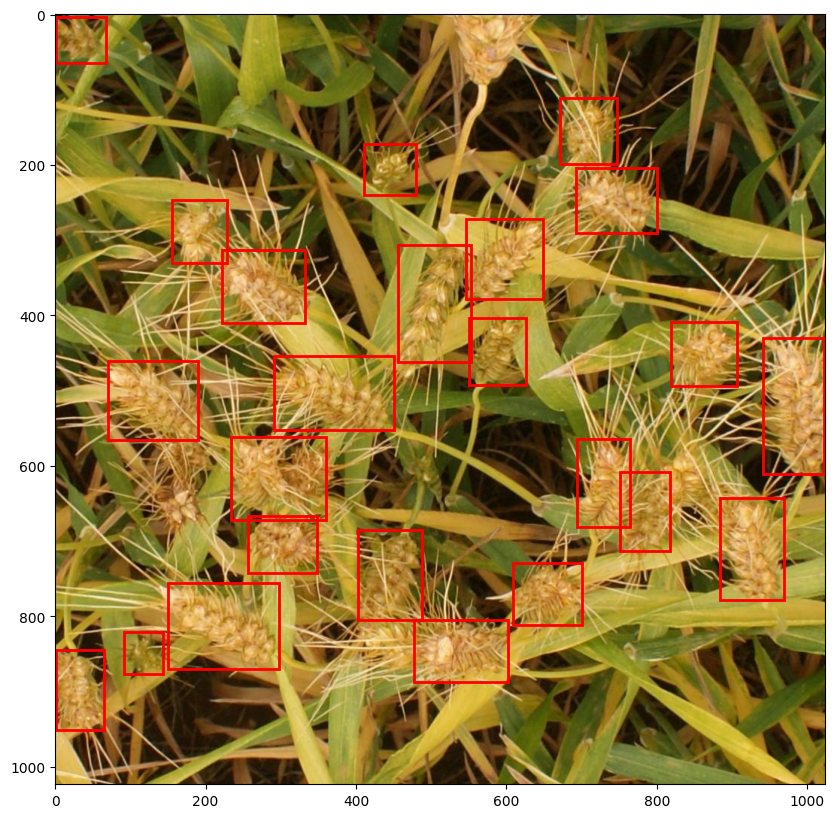

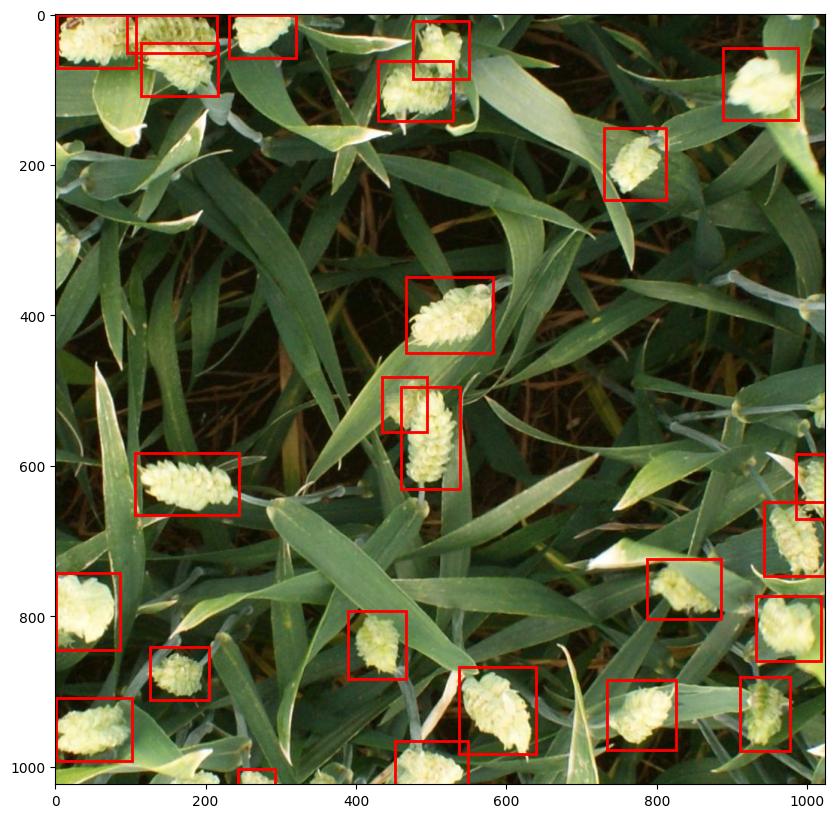

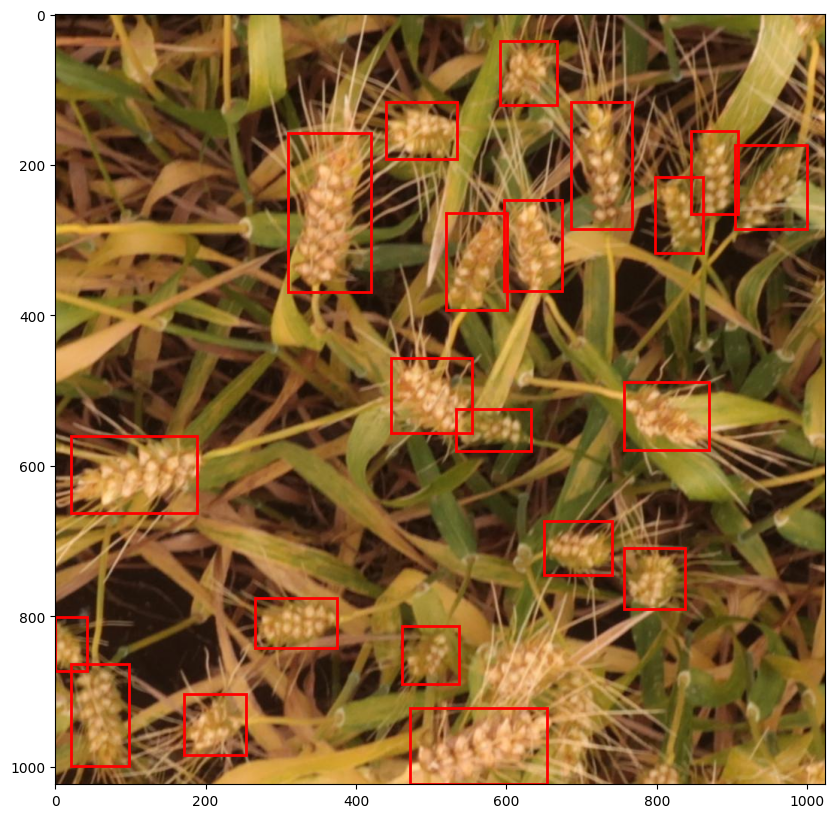

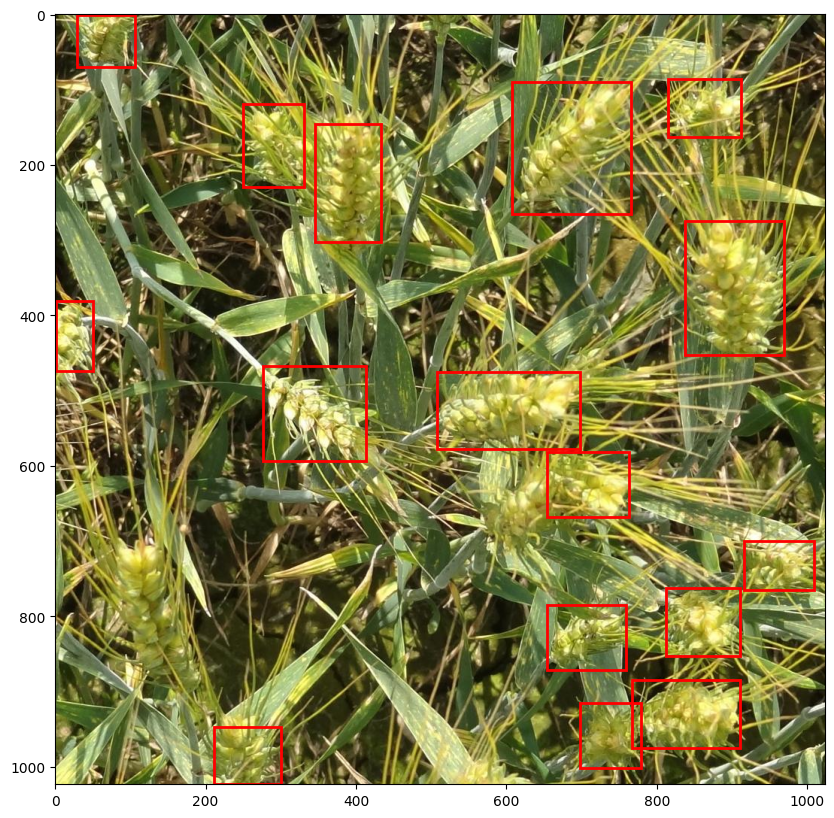

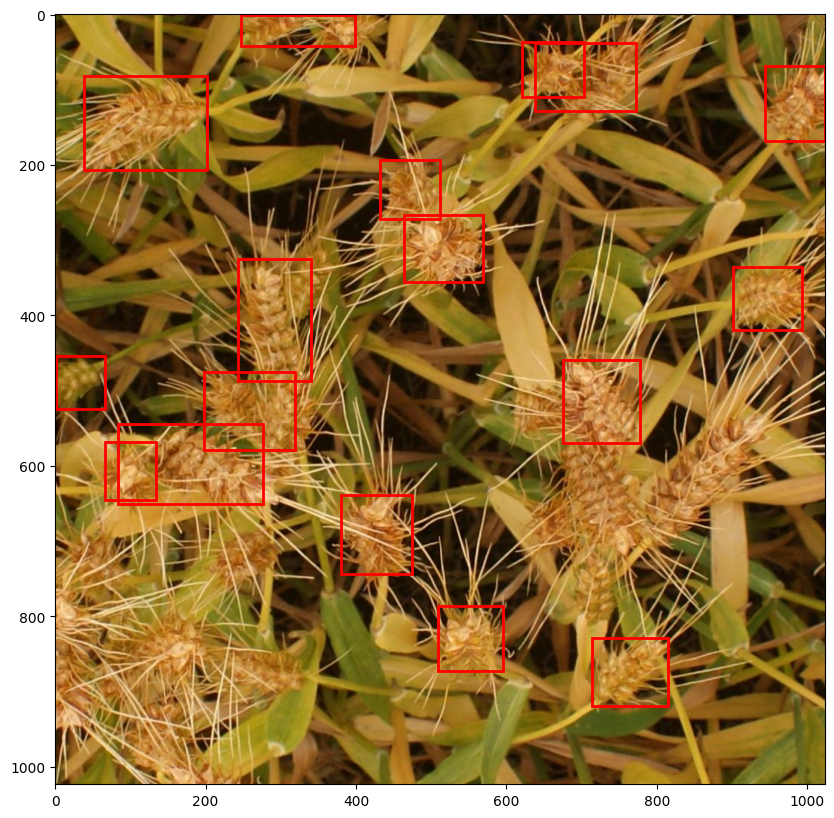

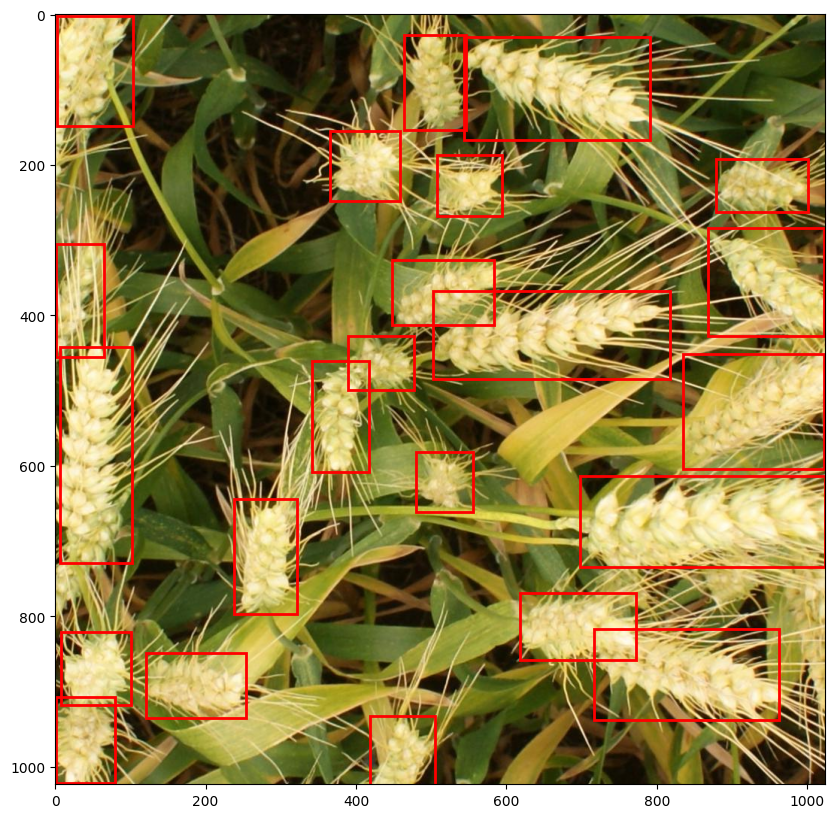

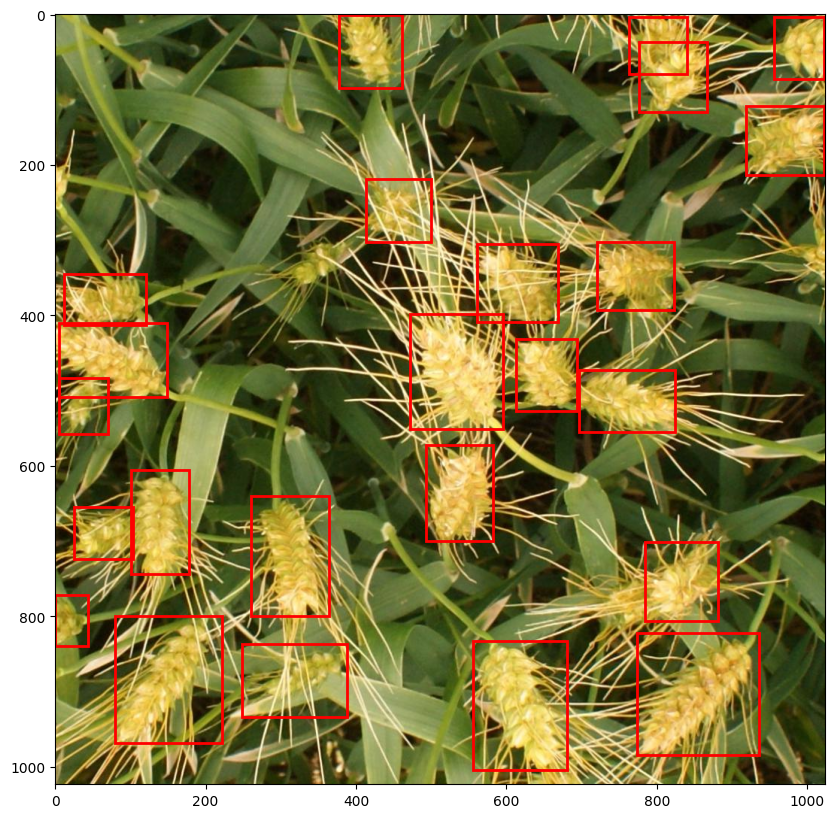

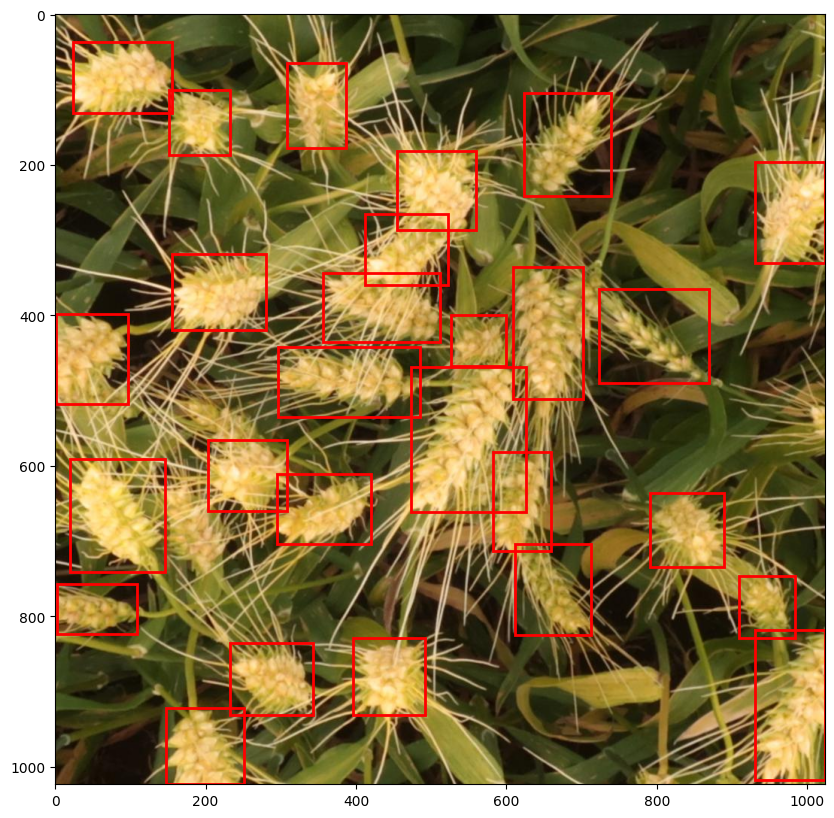

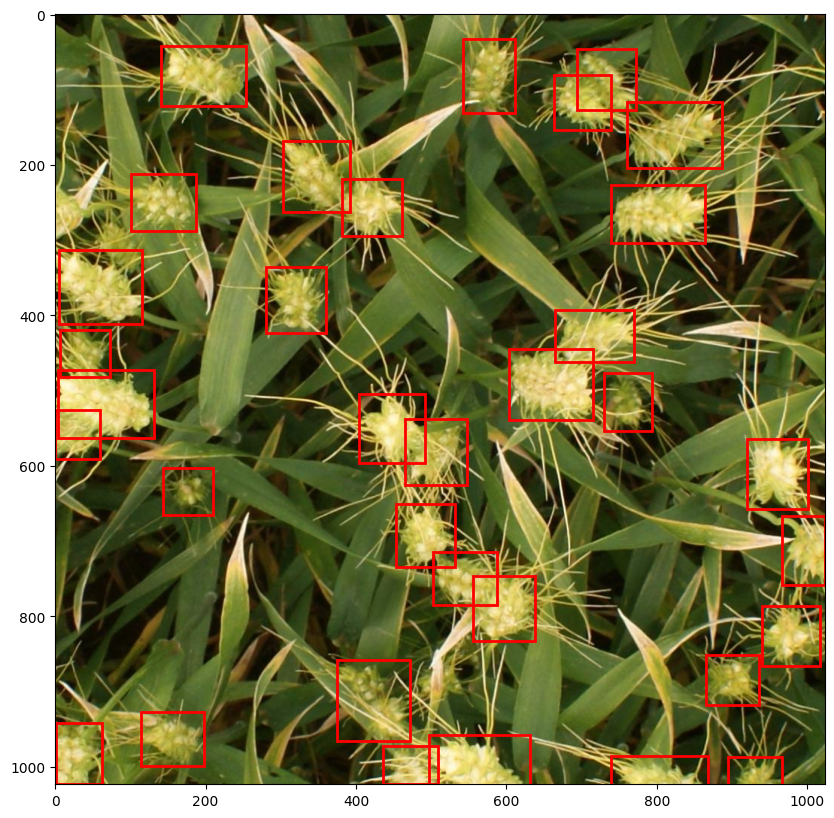

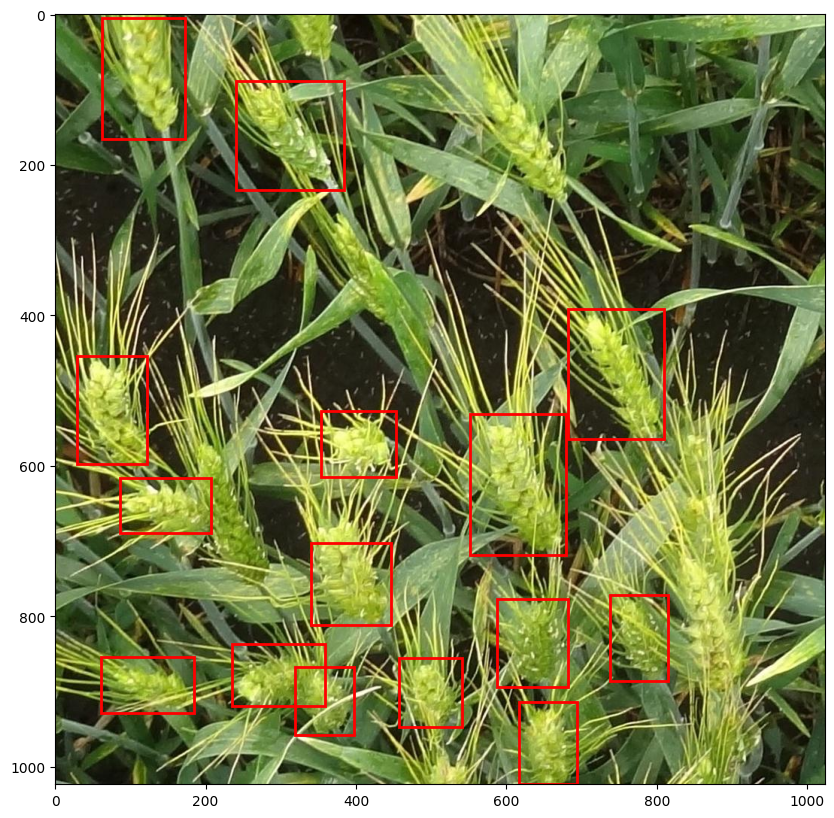

In [ ]:
# prompt: write code to predict for test data set and display the output image

import matplotlib.pyplot as plt
import matplotlib.patches as patches
# ... your existing code

model.eval()  # Set the model to evaluation mode

test_images_dir = '/content/global-wheat-detection/test/'
test_images = os.listdir(test_images_dir)

for test_image in test_images:
    image_path = os.path.join(test_images_dir, test_image)
    image = Image.open(image_path).convert('RGB')
    image_tensor = to_tensor(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predictions = model(image_tensor)

    # Display the image with bounding boxes
    boxes = predictions[0]['boxes'].cpu().numpy()
    scores = predictions[0]['scores'].cpu().numpy()

    # Filter predictions based on a score threshold (optional)
    score_threshold = 0.5
    filtered_indices = scores > score_threshold
    boxes = boxes[filtered_indices]

    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    ax = plt.gca()
    for box in boxes:
        rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show()
